# Osic Pulmonary Fibrosis Progression

Author: Ana RE

The aim of this competition is to predict a patient’s severity of decline in lung function based on a CT scan of their lungs. Lung function is assessed based on output from a spirometer, which measures the forced vital capacity (FVC), i.e. the volume of air exhaled.

In the dataset, you are provided with a baseline chest CT scan and associated clinical information for a set of patients. A patient has an image acquired at time Week = 0 and has numerous follow up visits over the course of approximately 1-2 years, at which time their FVC is measured.

## Step 1: Data Exploration

The first step will be to figure out what the data can tell us in order to find patterns, relationships, or anomalies. This will help us to proceed with our subsequent analysis.

### 1.1 Reading and understanding the associated clinical information data

<strong>Import requiered libraries</strong>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

from scipy import stats

import matplotlib.pyplot as plt
import seaborn as sns

<strong>Read the train and test .csv files</strong>

In [3]:
df_train = pd.read_csv('train.csv')
df_test = pd.read_csv('test.csv')

<strong>Number of samples, features and patients</strong>

In [4]:
print(f'Training Set Shape = {df_train.shape} - Patients = {df_train["Patient"].nunique()}')
print(f'Test Set Shape = {df_test.shape} - Patients = {df_test["Patient"].nunique()}')
print(f'The names of the features are {list(df_train.columns)}')

Training Set Shape = (1549, 7) - Patients = 176
Test Set Shape = (5, 7) - Patients = 5
The names of the features are ['Patient', 'Weeks', 'FVC', 'Percent', 'Age', 'Sex', 'SmokingStatus']


We have 1549 samples on the training set that correspond to 176 patients.
</p>
We have 5 samples on the testing set that correspond to 5 patients.

The datasets has 7 features. These are 'Patient', 'Weeks', 'FVC', 'Percent', 'Age', 'Sex' and 'SmokingStatus'

<strong>Visualisation of the first rows for both training set and test set</strong>

In [5]:
df_train.head()

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
0,ID00007637202177411956430,-4,2315,58.253649,79,Male,Ex-smoker
1,ID00007637202177411956430,5,2214,55.712129,79,Male,Ex-smoker
2,ID00007637202177411956430,7,2061,51.862104,79,Male,Ex-smoker
3,ID00007637202177411956430,9,2144,53.950679,79,Male,Ex-smoker
4,ID00007637202177411956430,11,2069,52.063412,79,Male,Ex-smoker


In [6]:
df_test.head()

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
0,ID00419637202311204720264,6,3020,70.186855,73,Male,Ex-smoker
1,ID00421637202311550012437,15,2739,82.045291,68,Male,Ex-smoker
2,ID00422637202311677017371,6,1930,76.672493,73,Male,Ex-smoker
3,ID00423637202312137826377,17,3294,79.258903,72,Male,Ex-smoker
4,ID00426637202313170790466,0,2925,71.824968,73,Male,Never smoked


<strong>Study of FVC measurements amongst patientients</strong>

In [7]:
FVCMeasurements_train = df_train.rename(columns={'Weeks': 'FVCMeasurements'}).groupby('Patient').agg('count')['FVCMeasurements'].value_counts()
print(f'Training Set FVC Measurements Per Patient \n{("-") * 41}\n{FVCMeasurements_train}')

Training Set FVC Measurements Per Patient 
-----------------------------------------
9     132
8      25
10     10
7       7
6       2
Name: FVCMeasurements, dtype: int64


All of the patients have their images acquired at Week 0, but all of the patients don't have FVC measured at Week 0 and their number of FVC measurements change from patient to patient.

Most of the patients have FVC measurements at 9 different timesteps but this number can change between 6 and 10. Thus, number of FVC measurements are not consistent for different patients.

There are **5** samples in `test.csv` and they belong to **5** different patients. Those samples and patients also exist in `train.csv`. They are the last 5 patients of training set and the samples are first measurements of those patients. This is because `test.csv` is a placeholder and the real test set is hidden. The purpose of placeholder test set is showing the structure of real test set and testing submissions. When the notebook is submitted, it runs with the real test set.

The real test set will have more than 5 patients. However, it will only have a baseline CT scan and only the initial FVC measurement. You are asked to predict the final three FVC measurements for each patient, as well as a confidence value in your prediction. In order to avoid potential leakage, you are asked to predict every patient's FVC measurement for every possible week. Weeks prior to final three weeks are ignored in scoring.

The simplest way of creating submissions is predicting `FVC` and `Confidence` for all test samples, then creating `Patient_Week` on test set and merging it to `sample_submission.csv`. This way submission file will have all of the predictions from test set regardless of their count. 

In [8]:
df_submission = pd.read_csv('sample_submission.csv' )
df_submission

,Patient_Week,FVC,Confidence
0,ID00419637202311204720264_-12,2000,100
1,ID00421637202311550012437_-12,2000,100
2,ID00422637202311677017371_-12,2000,100
3,ID00423637202312137826377_-12,2000,100
4,ID00426637202313170790466_-12,2000,100
...,...,...,...
725,ID00419637202311204720264_133,2000,100
726,ID00421637202311550012437_133,2000,100
727,ID00422637202311677017371_133,2000,100
728,ID00423637202312137826377_133,2000,100


### 1.2 Creating a Function to Compute the Laplace Log Likelihood

The aim of this problem is to the final three `FVC` measurements for each patient, as well as a `Confidence` value (standard deviation σ). We are also asked to predict every patient's `FVC` measurement for every possible week.

Predictions are evaluated with a modified version of the Laplace Log Likelihood. 

`Confidence` values smaller than 70 are clipped to reflect the approximate measurement uncertainty in `FVC`.

$\large \sigma_{clipped} = max(\sigma, 70),$

Errors greater than 1000 are also clipped in order to avoid large errors.

$\large \Delta = min ( |FVC_{true} - FVC_{predicted}|, 1000 ),$

The metric is defined as:

$\Large metric = -   \frac{\sqrt{2} \Delta}{\sigma_{clipped}} - \ln ( \sqrt{2} \sigma_{clipped} ).$

The final score is calculated by averaging the metric across all test set `Patient_Weeks` (three per patient).
Metric values will be negative and higher is better.

In [9]:
def laplace_log_likelihood(y_true, y_pred, sigma):
    sigma_clipped = np.maximum(sigma, 70)
    delta_clipped = np.minimum(np.abs(y_true - y_pred), 1000)
    metric = - np.sqrt(2) * delta_clipped / sigma_clipped - np.log(np.sqrt(2) * sigma_clipped)
    return np.mean(metric)

Let us suppose that everything is predicted perfectly (`Delta = 0`) with the highest confidence (`Sigma = 70`) and let us calculate the score:

In [10]:
laplace_log_likelihood(df_train['FVC'], df_train['FVC'], 70)

-4.595068832329223

### 1.3 Studying FVC measurements globally

The `FVC` measurements show the amount of air a person can forcefully and quickly exhale after taking a deep breath. Let us study the distribution of these measurements in the training set. In order to do this, we will compute some statistical properties.

In [11]:
print(f'FVC Statistical Properties \n{"-" * 26}\n')
print(f'Mean: {df_train["FVC"].mean():.6}')
print(f'Median: {df_train["FVC"].median():.6}')
print(f'Std: {df_train["FVC"].std():.6}')
print(f'Min: {df_train["FVC"].min()}')
print(f'25%: {df_train["FVC"].quantile(0.25)}')
print(f'50%: {df_train["FVC"].quantile(0.5)}')
print(f'75%: {df_train["FVC"].quantile(0.75)}')
print(f'Max: {df_train["FVC"].max()}')
print(f'Skew: {df_train["FVC"].skew():.6}')
print(f'Kurtosis: {df_train["FVC"].kurtosis():.6}')
missing_values= df_train[df_train["FVC"].isnull()].shape[0]
training_samples= df_train.shape[0]
print(f'Missing Values: {missing_values}/{training_samples} ({missing_values * 100 / training_samples:.4}%)')

FVC Statistical Properties 
--------------------------

Mean: 2690.48
Median: 2641.0
Std: 832.771
Min: 827
25%: 2109.0
50%: 2641.0
75%: 3171.0
Max: 6399
Skew: 0.584271
Kurtosis: 0.571985
Missing Values: 0/1549 (0.0%)


Even though the `FVC` predictions smaller than 1000 are clipped, the minimum value in training set is **827** and the 25th quantile is **2109**. There are no missing values.

To have a better understanding of the distribution of the `FVC` measurement in the training set we are going to plot it.

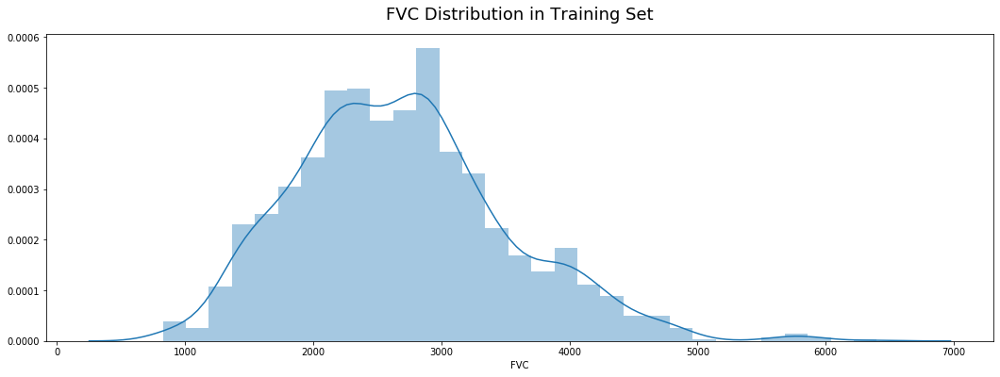

In [12]:
fig, axes = plt.subplots(figsize=(18, 6))
sns.distplot(df_train['FVC'], label='FVC').set_title('FVC Distribution in Training Set', pad=15, size =18)
plt.show()

Because some patients have extremely high `FVC` measurements,  the distribution is tailed on the right.
Most of the patients are close to the mean.

### 1.4 Studying FVC measurements for each patient

As mentioned before, we are asked to predict every patient's `FVC` measurement for every possible week. This means that we should be able to predict `FVC` values of different patients over 146 timesteps.

Therefore, we are now going to consider each patients' `FVC` as a function of time individually and study its statistical properties.

In [13]:
for patient, df in list(df_train.groupby('Patient')):
    print(f'Patient: {patient} FVC Statistical Properties\n{"-" * 61}')
    print(f'Mean: {df["FVC"].mean():.6}')
    print(f'Median: {df["FVC"].median():.6}')
    print(f'Std: {df["FVC"].std():.6}')
    print(f'Min: {df["FVC"].min()}')
    print(f'Max: {df["FVC"].max()}')
    print(f'Skew: {df["FVC"].skew():.6}')
    print(f'Kurtosis: {df["FVC"].kurtosis():.6}')
    print(f'\n')

Patient: ID00007637202177411956430 FVC Statistical Properties
-------------------------------------------------------------
Mean: 2113.89
Median: 2069.0
Std: 96.8561
Min: 2000
Max: 2315
Skew: 1.26267
Kurtosis: 1.31481


Patient: ID00009637202177434476278 FVC Statistical Properties
-------------------------------------------------------------
Mean: 3596.67
Median: 3625.0
Std: 197.368
Min: 3214
Max: 3895
Skew: -0.704114
Kurtosis: 1.06018


Patient: ID00010637202177584971671 FVC Statistical Properties
-------------------------------------------------------------
Mean: 3037.11
Median: 3030.0
Std: 358.434
Min: 2474
Max: 3523
Skew: -0.493364
Kurtosis: -0.53517


Patient: ID00011637202177653955184 FVC Statistical Properties
-------------------------------------------------------------
Mean: 3387.0
Median: 3410.0
Std: 113.774
Min: 3193
Max: 3541
Skew: -0.359377
Kurtosis: -0.684807


Patient: ID00012637202177665765362 FVC Statistical Properties
--------------------------------------------------

Skew: -0.269737
Kurtosis: -1.41942


Patient: ID00192637202245493238298 FVC Statistical Properties
-------------------------------------------------------------
Mean: 1782.78
Median: 1829.0
Std: 114.376
Min: 1568
Max: 1929
Skew: -0.843985
Kurtosis: 0.0886456


Patient: ID00196637202246668775836 FVC Statistical Properties
-------------------------------------------------------------
Mean: 3907.89
Median: 3856.0
Std: 175.753
Min: 3792
Max: 4360
Skew: 2.61321
Kurtosis: 7.27874


Patient: ID00197637202246865691526 FVC Statistical Properties
-------------------------------------------------------------
Mean: 2512.56
Median: 2360.0
Std: 532.78
Min: 1941
Max: 3399
Skew: 0.809177
Kurtosis: -0.600901


Patient: ID00199637202248141386743 FVC Statistical Properties
-------------------------------------------------------------
Mean: 2814.44
Median: 2844.0
Std: 106.27
Min: 2672
Max: 2949
Skew: -0.462282
Kurtosis: -1.58164


Patient: ID00202637202249376026949 FVC Statistical Properties
-------------


Patient: ID00423637202312137826377 FVC Statistical Properties
-------------------------------------------------------------
Mean: 2750.0
Median: 2700.0
Std: 265.29
Min: 2432
Max: 3294
Skew: 1.10646
Kurtosis: 1.19357


Patient: ID00426637202313170790466 FVC Statistical Properties
-------------------------------------------------------------
Mean: 2896.33
Median: 2916.0
Std: 93.2322
Min: 2712
Max: 2978
Skew: -1.29381
Kurtosis: 0.754953




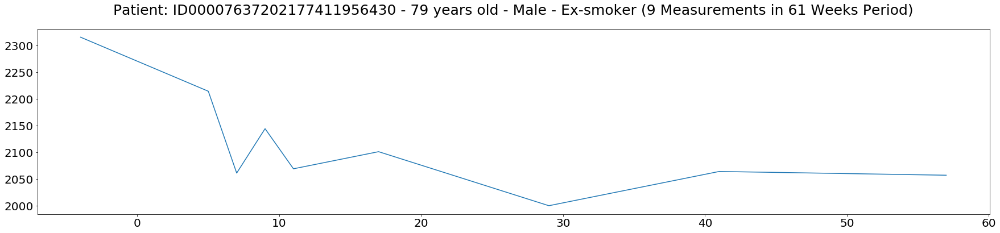

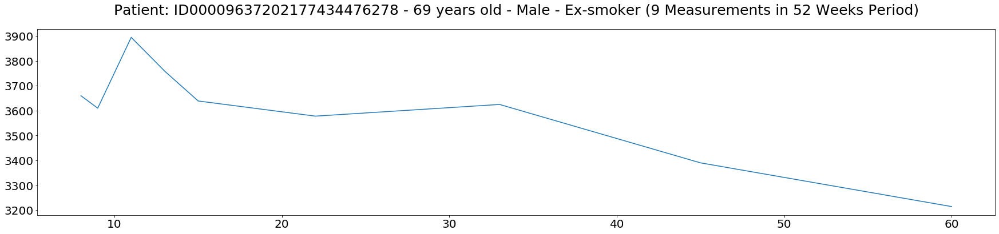

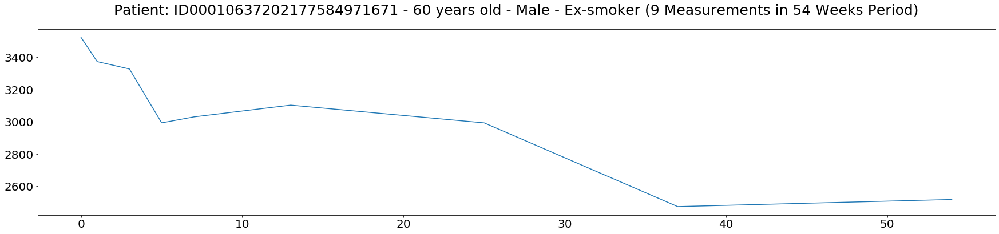

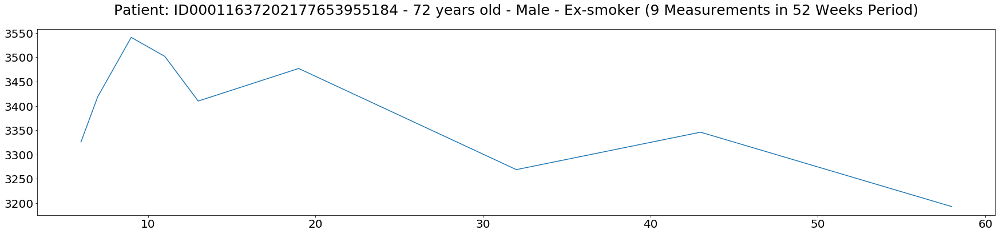

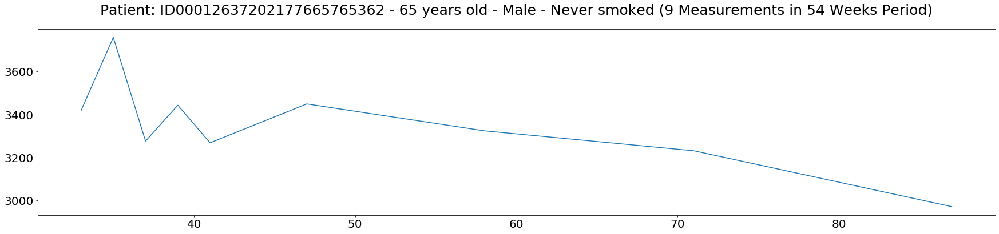

...

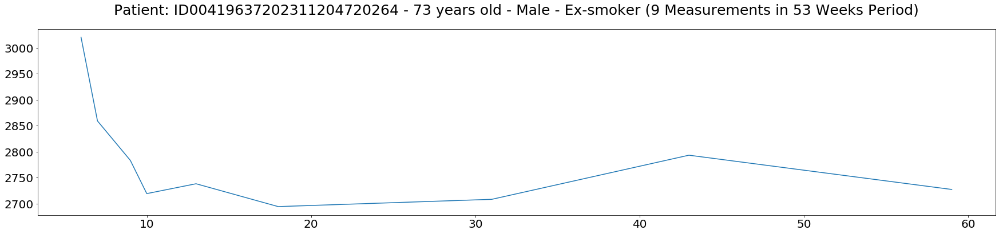

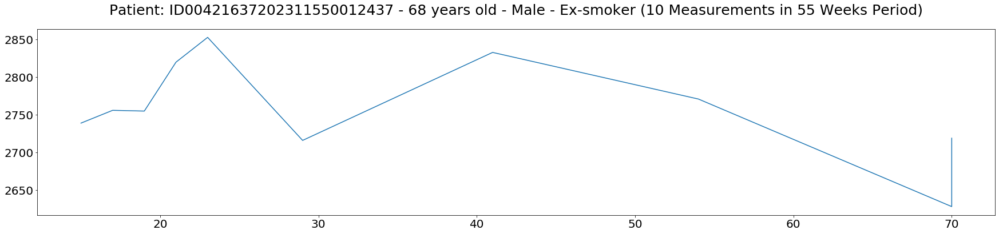

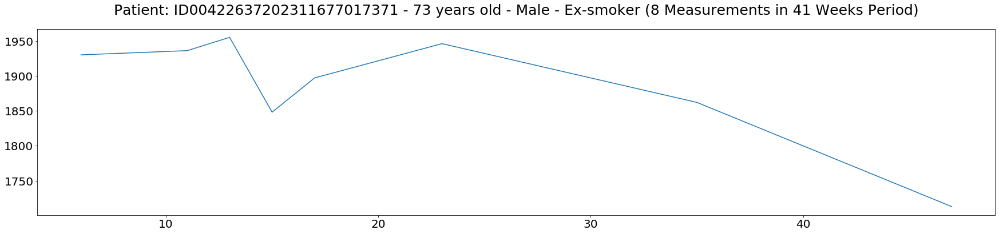

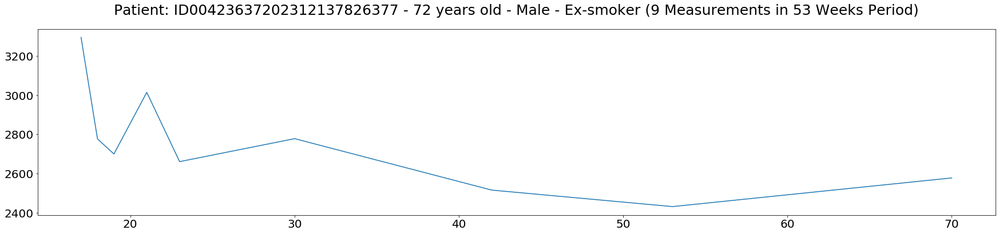

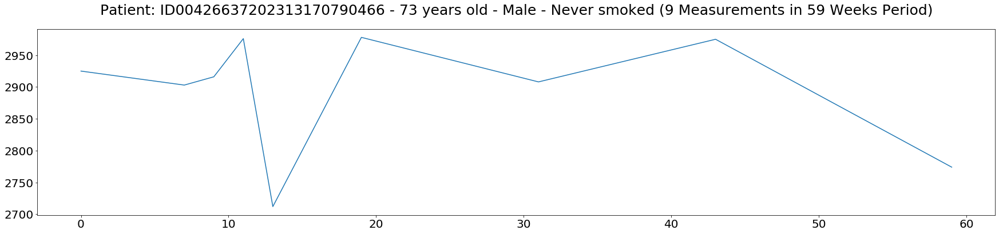

In [14]:
def plot_fvc(df, patient): 
    df[['Weeks', 'FVC']].set_index('Weeks').plot(figsize=(30, 6), label='_nolegend_')
    plt.tick_params(axis='x', labelsize=20)
    plt.tick_params(axis='y', labelsize=20)
    plt.xlabel('')
    plt.ylabel('')
    plt.title(f'Patient: {patient} - {df["Age"].tolist()[0]} years old - {df["Sex"].tolist()[0]} - {df["SmokingStatus"].tolist()[0]} ({len(df)} Measurements in {(df["Weeks"].max() - df["Weeks"].min())} Weeks Period)', size=25, pad=25)
    print(f'\n')
    plt.legend().set_visible(False)
    plt.show()
      
for patient, df in list(df_train.groupby('Patient')):  
    plot_fvc(df, patient)

<strong> Some conclusions from the graphs </strong>
</br>
 - The majority of the patients got worse over the weeks.
 - `FVC` fluctuates too much over time in some patients.
 - Just a few patients got better;  their `FVC` is increasing linearly with very few fluctuations.

### 1.4 Studying continuous features

There are **three** continuous features. Those features are:

* `Weeks`: The relative number of weeks pre and post the baseline CT (note that this can be negative). At first glance, it doesn't seen to have any significant relationship with other features.
* `Percent`: A value that approximates the patient's `FVC` as a percent of the typical `FVC` for a person of similar characteristics. This feature has a strong relationship with `FVC` because it is computed from it.
* `Age`: Age of the patient. Since younger patients have higher lung capacity, `Age` has a slight relationship with `FVC` and `Percent`.

In order to study the relationships between these features and `FVC`, we are going to compute **pair plots**.

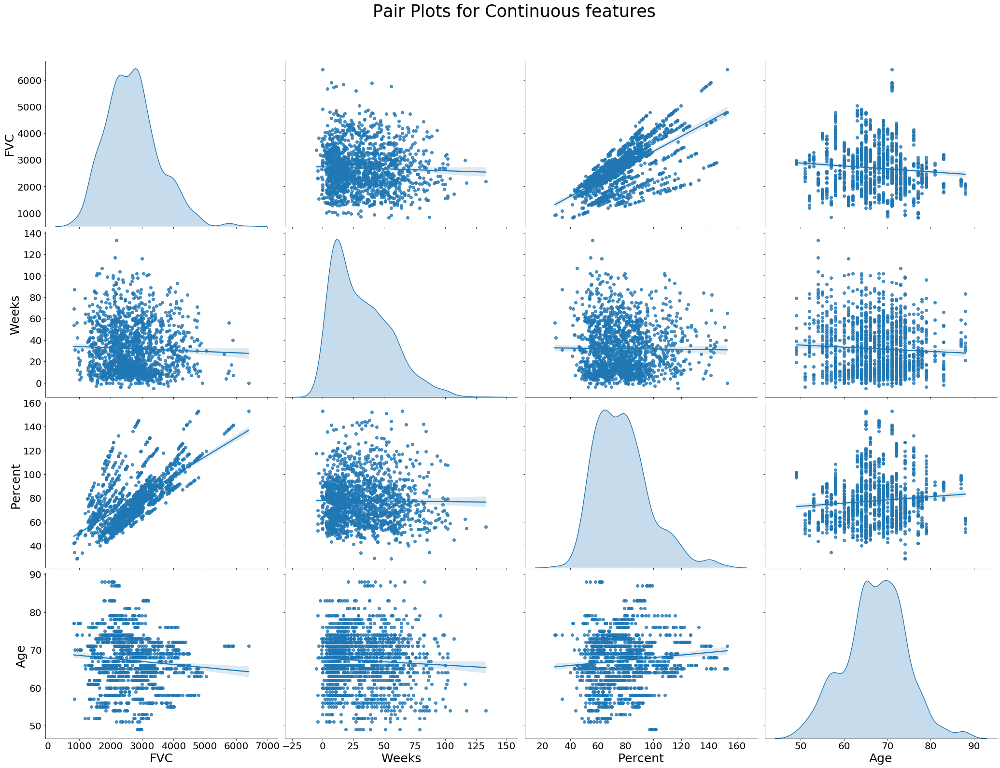

In [15]:
g = sns.pairplot(df_train[['FVC', 'Weeks', 'Percent', 'Age']], aspect=1.4, height=5, diag_kind='kde', kind='reg')

g.axes[3, 0].set_xlabel('FVC', fontsize=25)
g.axes[3, 1].set_xlabel('Weeks', fontsize=25)
g.axes[3, 2].set_xlabel('Percent', fontsize=25)
g.axes[3, 3].set_xlabel('Age', fontsize=25)
g.axes[0, 0].set_ylabel('FVC', fontsize=25)
g.axes[1, 0].set_ylabel('Weeks', fontsize=25)
g.axes[2, 0].set_ylabel('Percent', fontsize=25)
g.axes[3, 0].set_ylabel('Age', fontsize=25)

g.axes[3, 0].tick_params(axis='x', labelsize=20)
g.axes[3, 1].tick_params(axis='x', labelsize=20)
g.axes[3, 2].tick_params(axis='x', labelsize=20)
g.axes[3, 3].tick_params(axis='x', labelsize=20)
g.axes[0, 0].tick_params(axis='y', labelsize=20)
g.axes[1, 0].tick_params(axis='y', labelsize=20)
g.axes[2, 0].tick_params(axis='y', labelsize=20)
g.axes[3, 0].tick_params(axis='y', labelsize=20)

g.fig.suptitle('Pair Plots for Continuous features', fontsize=35, y=1.08)

plt.show()

Distributions of `FVC`, `Percent` and `Age` are very similar but `Weeks` is different than those features. These graphs confirm our preliminar hypothesises. To confirm it even further, we compute a correlation matrix. 

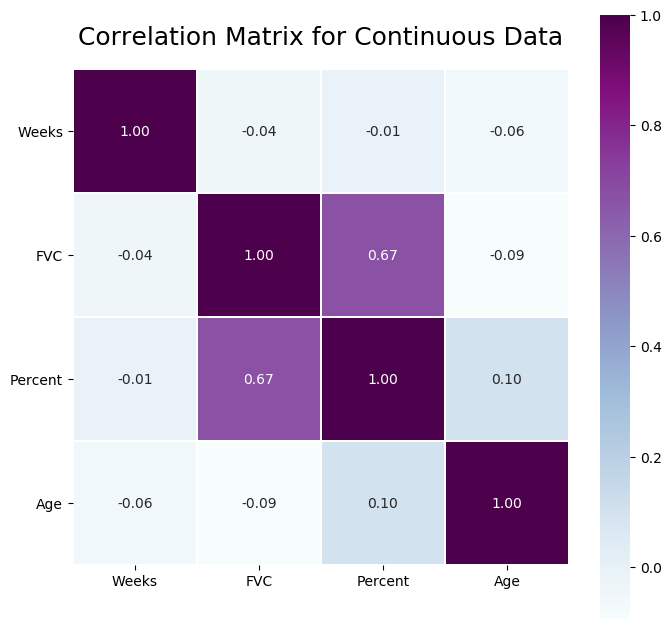

In [16]:
fig = plt.figure(figsize=(8, 8), dpi=100)

sns.heatmap(df_train.corr(), annot=True, square=True, cmap='BuPu', annot_kws={'size': 10}, fmt='.2f', linewidths=.5)   

plt.tick_params(axis='x', labelsize=10, rotation=0)
plt.tick_params(axis='y', labelsize=10, rotation=0)
plt.title('Correlation Matrix for Continuous Data', size=18, pad=18)

plt.show()

**Conlusion:**
From the continuous data, just `Percent` will give informations regarding `FVC`.

### 1.5 Studying categorical features

We have two categorical features, `Sex` and `SmokingStatus`. Let's first study them with a barplot.

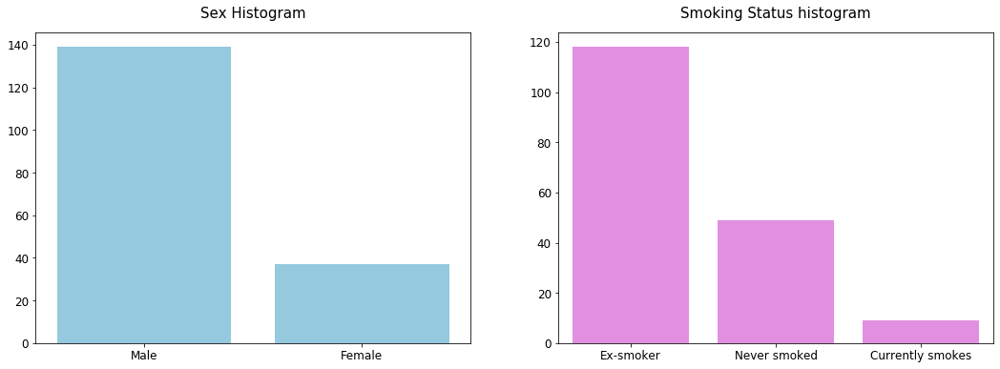

Sex
----------------------------------------
Number of males:
139
Number of females:
37
Male (%78.98) Female (%21.02)


Smoking Status
----------------------------------------
Ex-smoker:
118
Never Smoked:
49
Currently Smokes:
9
Ex-smoker (%67.05) Never smoked (%27.84) Currently Smokes (%5.11)


In [18]:
fig, axes = plt.subplots(ncols=2,figsize=(18, 6))

sns.barplot(x=df_train.groupby('Patient')['Sex'].first().value_counts().index, y=df_train.groupby('Patient')['Sex'].first().value_counts(), ax=axes[0], color="skyblue")
percentages0 = [(count / df_train.groupby('Patient')['Sex'].first().value_counts().sum() * 100).round(2) for count in df_train.groupby('Patient')['Sex'].first().value_counts()]

axes[0].set_ylabel('')
axes[0].set_xticks(np.arange(2), [f'Male (%{percentages0[0]})', f'Female (%{percentages0[1]})'])
axes[0].tick_params(axis='x', labelsize=12)
axes[0].tick_params(axis='y', labelsize=12)
axes[0].set_title('Sex Histogram', size=15, pad=15)


sns.barplot(x=df_train.groupby('Patient')['SmokingStatus'].first().value_counts().index, y=df_train.groupby('Patient')['SmokingStatus'].first().value_counts(),ax=axes[1], color="violet")
percentages1 = [(count / df_train.groupby('Patient')['SmokingStatus'].first().value_counts().sum() * 100).round(2) for count in df_train.groupby('Patient')['SmokingStatus'].first().value_counts()]

axes[1].set_ylabel('')
axes[1].set_xticks(np.arange(3), [f'Ex-smoker (%{percentages1[0]})', f'Never smoked (%{percentages1[1]})', f'Currently Smokes (%{percentages1[2]})'])
axes[1].tick_params(axis='x', labelsize=12)
axes[1].tick_params(axis='y', labelsize=12)
axes[1].set_title('Smoking Status histogram', size=15, pad=15)

plt.show()
print(f'Sex\n{"-" * 40}')
print(f'Number of males:')
print(df_train.groupby('Patient')['Sex'].first().value_counts()[0])
print(f'Number of females:')
print(df_train.groupby('Patient')['Sex'].first().value_counts()[1])
print(f'Male (%{percentages0[0]})', f'Female (%{percentages0[1]})')
print(f'\n')
print(f'Smoking Status\n{"-" * 40}')
print(f'Ex-smoker:')
print(df_train.groupby('Patient')['SmokingStatus'].first().value_counts()[0])
print(f'Never Smoked:')
print(df_train.groupby('Patient')['SmokingStatus'].first().value_counts()[1])
print(f'Currently Smokes:')
print(df_train.groupby('Patient')['SmokingStatus'].first().value_counts()[2])
print(f'Ex-smoker (%{percentages1[0]})', f'Never smoked (%{percentages1[1]})', f'Currently Smokes (%{percentages1[2]})')

Summarising:

- **139** (79%) patients are male and **37** (21%) patients are female.
- **118** (67%) patients are ex-smokers, **49** (28%) never smoked and **9** (5%) currently smoke.

Let's compute again a pair plots but now between sex groups.

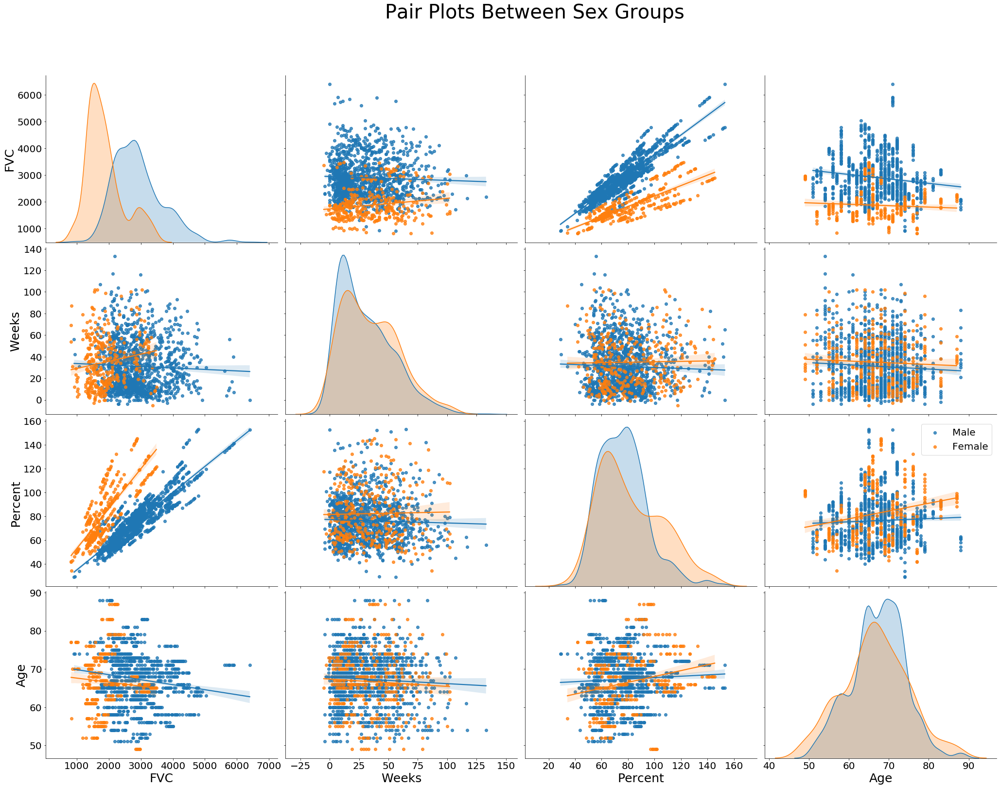

In [19]:
g = sns.pairplot(df_train[['FVC', 'Weeks', 'Percent', 'Age', 'Sex']], hue='Sex', aspect=1.4, height=5, diag_kind='kde', kind='reg')
g.axes[3, 0].set_xlabel('FVC', fontsize=25)
g.axes[3, 1].set_xlabel('Weeks', fontsize=25)
g.axes[3, 2].set_xlabel('Percent', fontsize=25)
g.axes[3, 3].set_xlabel('Age', fontsize=25)
g.axes[0, 0].set_ylabel('FVC', fontsize=25)
g.axes[1, 0].set_ylabel('Weeks', fontsize=25)
g.axes[2, 0].set_ylabel('Percent', fontsize=25)
g.axes[3, 0].set_ylabel('Age', fontsize=25)
g.axes[3, 0].tick_params(axis='x', labelsize=20)
g.axes[3, 1].tick_params(axis='x', labelsize=20)
g.axes[3, 2].tick_params(axis='x', labelsize=20)
g.axes[3, 3].tick_params(axis='x', labelsize=20)
g.axes[0, 0].tick_params(axis='y', labelsize=20)
g.axes[1, 0].tick_params(axis='y', labelsize=20)
g.axes[2, 0].tick_params(axis='y', labelsize=20)
g.axes[3, 0].tick_params(axis='y', labelsize=20)
plt.legend(prop={'size': 20})
g._legend.remove()
g.fig.suptitle('Pair Plots Between Sex Groups', fontsize=40, y=1.1)
plt.show()

We find that:

- The relationships between `FVC` and other features are different when compared between sex.
- The relationship of `FVC` with `Percent` and `Age` in males is stronger compared to the female ones.
- `FVC` distributions of males and females are very different from each other which makes sense taking into account biological differences between males and females, as on average, males have higher lung capacity than females. 
- `Percent` distributions of males and femals are also different from each other which was expected as `Percent` is computed from `FVC`.

Let's now do the same for the feature `SmokingStatus`

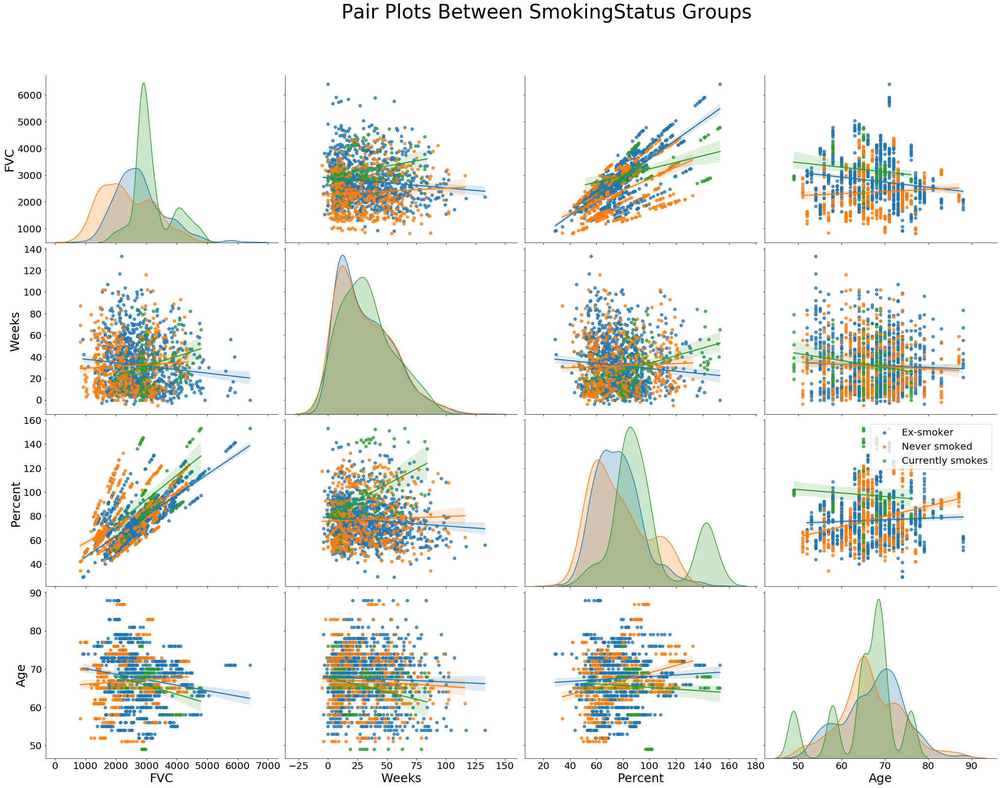

In [20]:
g = sns.pairplot(df_train[['FVC', 'Weeks', 'Percent', 'Age', 'SmokingStatus']], hue='SmokingStatus', aspect=1.4, height=5, diag_kind='kde', kind='reg')
g.axes[3, 0].set_xlabel('FVC', fontsize=25)
g.axes[3, 1].set_xlabel('Weeks', fontsize=25)
g.axes[3, 2].set_xlabel('Percent', fontsize=25)
g.axes[3, 3].set_xlabel('Age', fontsize=25)
g.axes[0, 0].set_ylabel('FVC', fontsize=25)
g.axes[1, 0].set_ylabel('Weeks', fontsize=25)
g.axes[2, 0].set_ylabel('Percent', fontsize=25)
g.axes[3, 0].set_ylabel('Age', fontsize=25)
g.axes[3, 0].tick_params(axis='x', labelsize=20)
g.axes[3, 1].tick_params(axis='x', labelsize=20)
g.axes[3, 2].tick_params(axis='x', labelsize=20)
g.axes[3, 3].tick_params(axis='x', labelsize=20)
g.axes[0, 0].tick_params(axis='y', labelsize=20)
g.axes[1, 0].tick_params(axis='y', labelsize=20)
g.axes[2, 0].tick_params(axis='y', labelsize=20)
g.axes[3, 0].tick_params(axis='y', labelsize=20)
plt.legend(prop={'size': 20})
g._legend.remove()
g.fig.suptitle('Pair Plots Between SmokingStatus Groups', fontsize=40, y=1.1)
plt.show()

We find that:

- `FVC` distributions of the `SmokingStatus` groups are a bit contraintuitive as the `FVC` mean of smokers is higher than the `FVC` mean of ex-smokers and patients who had never smoked.

- The fact that smokers have the strongest positive linear relationship between `FVC` and `Weeks` is also contraintuitive. This positive linear relationship is accentuated between `Percent` and `Weeks`.

- The distribution of `Weeks` is similar for different `SmokingStatus` and very different for the rest of the features. However, the `Percent` distributions is kind of similar to  the `FVC` distributions. 